# Low-Rank NMF vs Classical NMF

We will compare the performance of Low-Rank NMF and Classical NMF across data settings. For each choice, we will compare rank-1 and rank-10 updates ($k = 1,10$) and 1,5, and 10 subiterations.


Some smaller changes since last time:
- We replaced the Hessian step size trace calculations with equivalent and faster Frobenius norm calculations.
- We have moved over to using relative error ($\|X - WH\|_F^2 / \|X\|_F^2$) rather than absolute error
- We have improved the plotting code significantly, and added the interpolated plots suggested by Hanbaek (shown in Section 2)
- Initialization size continues to be important. Upon closer inspection, the `sklearn` implementations also deal with this (rescaling the data causes different performance). For now, we are just continuing to use [0,1] initialization, which seems to work well without oscillation or divergence.

In [2]:
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
from timing_experiment import full_settings, make_loss_plot, make_scatterplot, make_interpolated_timing_plot
import plotly
import plotly.io as pio
pio.renderers.default = "notebook"
plotly.offline.init_notebook_mode()

## 1 | Rank $r$ of W,H vs. rank of data

For $X \in \mathbb{R}_+^{m \times n}, W \in \mathbb{R}_+^{m \times r}, H \in \mathbb{R}_+^{r \times n}$, we will compare either high or low rank data (relative to the ambient dimension) and either high or low $r$. 

### 1.1 | High data rank, high $r$

In [5]:
trials, fixed, variable = full_settings(nn=True, use_NMF=True, 
                                        subiters=[1,5,10], k=[1,10],
                                        iters=20, m=100, n=100, l=0, n_trials=10,
                                        data_rank=100, r=100) # <<<<<

100%|██████████| 10/10 [00:06<00:00,  1.44it/s]


100%|██████████| 6/6 [00:00<00:00, 1552.01it/s]


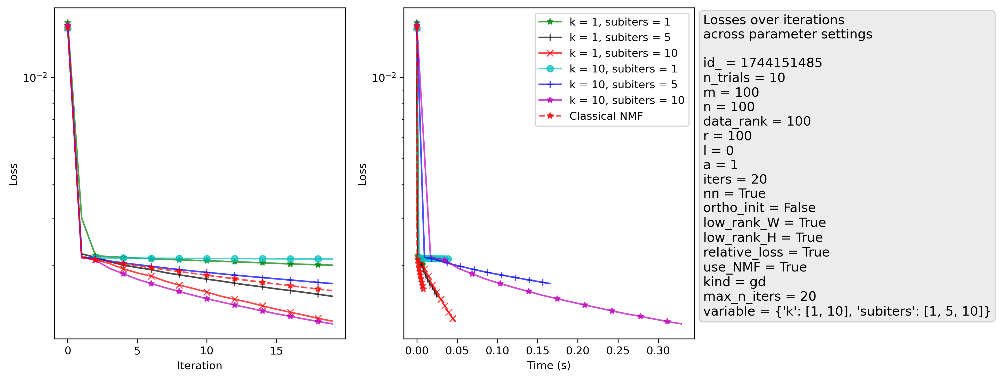

In [6]:
make_loss_plot(trials, fixed, variable)

In [7]:
newfig = make_scatterplot(trials, fixed, variable)

100%|██████████| 6/6 [00:00<00:00, 732.12it/s]


**We see that we can achieve lower losses, but we are still not faster than Classical NMF.**

### 1.2 | High data rank, low $r$

In [10]:
trials, fixed, variable = full_settings(nn=True, use_NMF=True, 
                                        subiters=[1,5,10], k=[1,10],
                                        iters=20, m=100, n=100, l=0, n_trials=10,
                                        data_rank=100, r=10) # <<<<<

100%|██████████| 10/10 [00:02<00:00,  4.23it/s]


100%|██████████| 6/6 [00:00<?, ?it/s]


<Figure size 3000x2400 with 0 Axes>

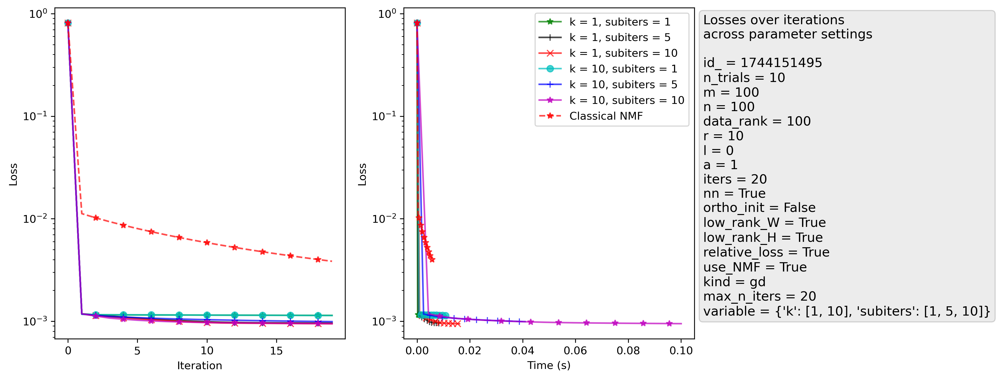

In [11]:
make_loss_plot(trials, fixed, variable)

In [12]:
newfig = make_scatterplot(trials, fixed, variable)

100%|██████████| 6/6 [00:00<00:00, 80.32it/s]


**In this case, Low-rank NMF with $k=1$ and 1 subiteration both takes less time and has substantially lower loss.**

### 1.3 | Low data rank, high $r$

In [15]:
trials, fixed, variable = full_settings(nn=True, use_NMF=True, 
                                        subiters=[1,5,10], k=[1,10],
                                        iters=20, m=100, n=100, l=0, n_trials=10,
                                        data_rank=10, r=100) # <<<<<

100%|██████████| 10/10 [00:07<00:00,  1.38it/s]


100%|██████████| 6/6 [00:00<?, ?it/s]


<Figure size 3000x2400 with 0 Axes>

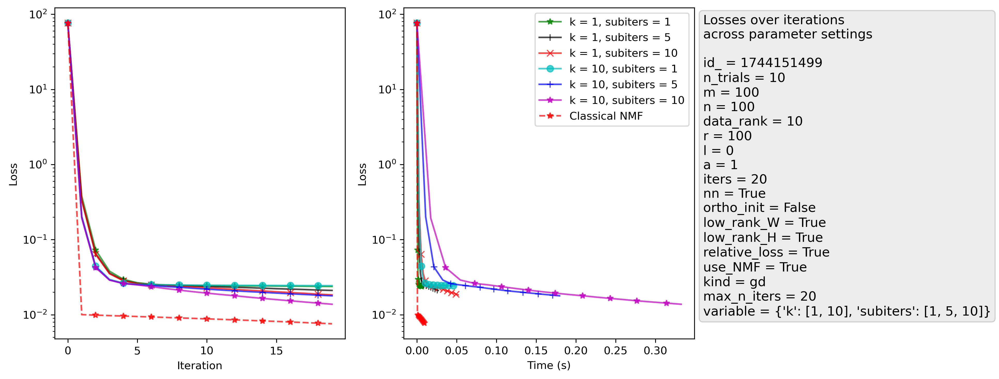

In [16]:
make_loss_plot(trials, fixed, variable)

In [17]:
newfig = make_scatterplot(trials, fixed, variable)

100%|██████████| 6/6 [00:00<00:00, 407.27it/s]


**In this case, while we can achieve marginally faster convergence, Classical NMF has substantially lower loss.**

### 1.4 | Low data rank, low $r$

In [20]:
trials, fixed, variable = full_settings(nn=True, use_NMF=True, 
                                        subiters=[1,5,10], k=[1,10],
                                        iters=20, m=100, n=100, l=0, n_trials=10,
                                        data_rank=10, r=10) # <<<<<

100%|██████████| 10/10 [00:02<00:00,  4.52it/s]


100%|██████████| 6/6 [00:00<00:00, 937.31it/s]


<Figure size 3000x2400 with 0 Axes>

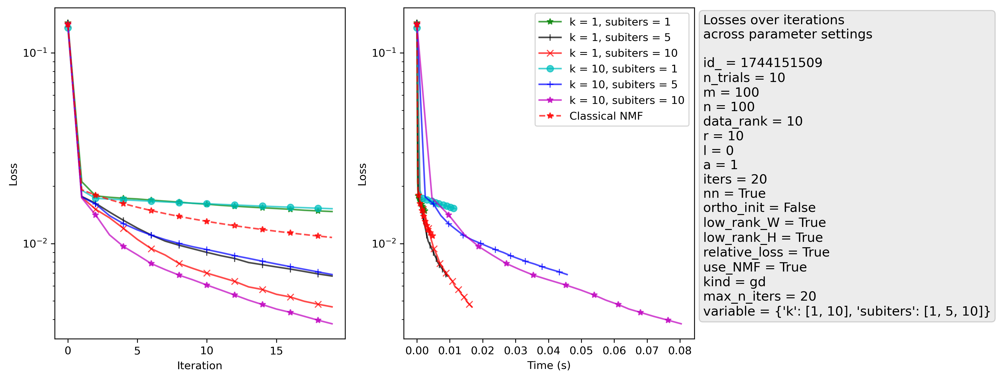

In [21]:
make_loss_plot(trials, fixed, variable)

In [22]:
newfig = make_scatterplot(trials, fixed, variable)

100%|██████████| 6/6 [00:00<00:00, 999.12it/s]


**In this case, we have a trade-off: more subiterations yield lower losses at the cost of higher time. Increasing the rank of the updates does not seem useful.**

## 2 | Gradient Descent vs. ALS

These are first attempts at implementing ALS updates in Python, matching Kamrun's MATLAB implementation. We have initial results as below, but there are still some problems: we are running into non-convergence issues (`Intel mKL ERROR: Parameter 4 was incorrect on entry to DLASCL.`) when trying to run with certain parameter settings. This may be a simple error in the code, or it may have to do with differences with the MATLAB `/` and `\` operators and NumPy's `linalg.lstsq` solver. I am less familiar with the former, so I will need to look into this.

In [25]:
trials, fixed, variable = full_settings(nn=True, use_NMF=True, 
                                        subiters=[1,10], k=[1,10],
                                        iters=20, m=100, n=100, l=0, n_trials=10,
                                        data_rank=50, r=10,
                                       kind = ['gd', 'als']) # <<<<<

100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


100%|██████████| 8/8 [00:00<00:00, 529.48it/s]


<Figure size 3000x2400 with 0 Axes>

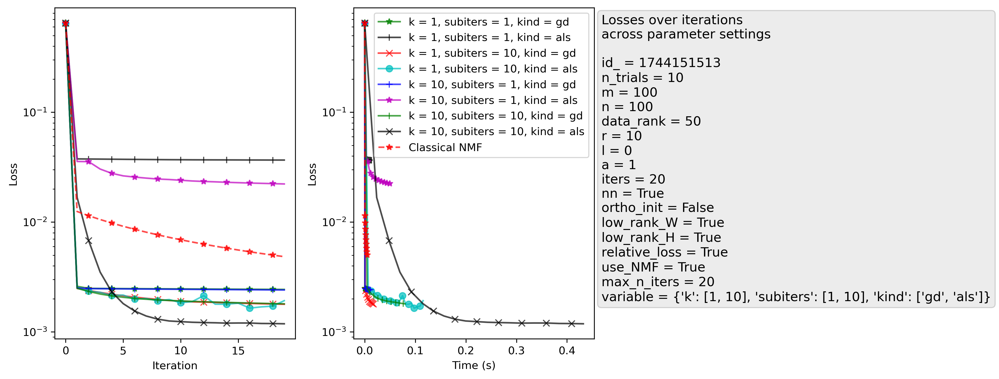

In [26]:
make_loss_plot(trials, fixed, variable)

In [27]:
newfig = make_scatterplot(trials, fixed, variable)

100%|██████████| 8/8 [00:00<00:00, 691.83it/s]


100%|██████████| 8/8 [00:00<00:00, 484.78it/s]


<Figure size 3000x2400 with 0 Axes>

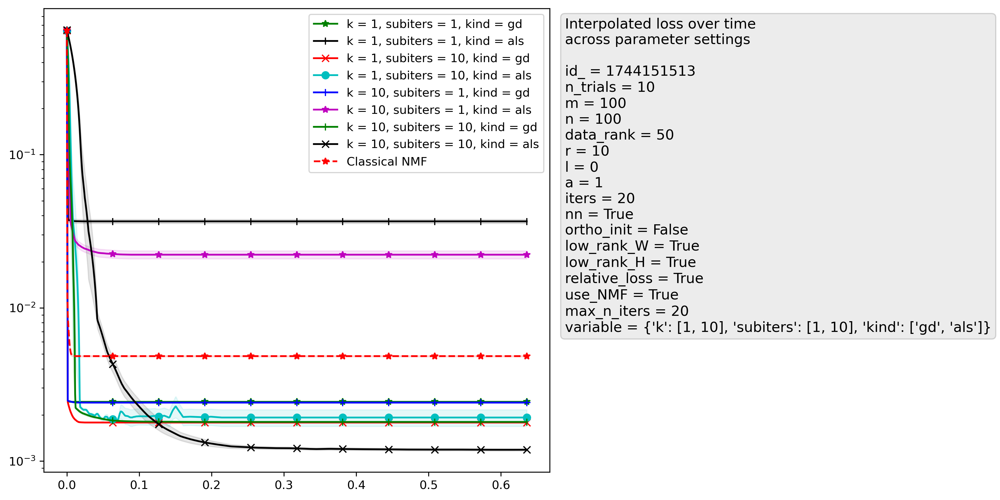

In [28]:
make_interpolated_timing_plot(trials, fixed, variable)

**Overall, though, it seems like ALS updates may be promising for lower loss values, but it seems that they are much more expensive in time. Again, this may be able to be helped with more efficient implementations.**